## Manually colapse the events in images 

Collapse the events in the frames to get the most active pixels and get an 'artificial brightnest' of the image 


In [6]:
# Get system path 
import os
path = os.getcwd()
# Get parent directory
parent = os.path.dirname(path)
#Add parent directory to system path
os.sys.path.insert(0, parent)

from metavision_core.event_io import EventsIterator
import numpy as np
import matplotlib.pyplot as plt

from lib.utils import *
from lib.plot_utils import *   
from lib.event_processing import *

from metavision_core.event_io import EventsIterator
from metavision_sdk_core import PeriodicFrameGenerationAlgorithm
from metavision_sdk_ui import EventLoop, BaseWindow, Window, UIAction, UIKeyEvent

import cv2

In [7]:
#Dynamicaly reload modules in juptyer notebook
%load_ext autoreload 
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## SUN CALIBRATION


In [8]:
from lib.event_processing import *  

path = "../data/recordings/sun_calibration_FOV_2_25-01.raw"
mv_iterator = EventsIterator(input_path=path, delta_t=1000)

height, width = mv_iterator.get_size()  # Camera Geometry
event_frame_gen = PeriodicFrameGenerationAlgorithm(width, height, accumulation_time_us=10000)

frames = []

def on_cd_frame_cb(ts, cd_frame):
    # window.show(cd_frame)
    frames.append(cd_frame)

event_frame_gen.set_output_callback(on_cd_frame_cb)

for evs in mv_iterator:
    event_frame_gen.process_events(evs)

print('Original lenght', len(frames))

max_buffer = len(frames)
blend = np.array(np.zeros((cv2.cvtColor(np.array(frames[0]), cv2.COLOR_BGR2GRAY).shape)))
compact_frames = []
count = 0
frames_buffer = []

for frame in frames:
    frames_buffer.append(frame)

    if len(frames_buffer) == max_buffer:
        blend = calibration_blend(frames_buffer)
        # blend = blend_buffer(frames_buffer)

        compact_frames.append(blend.astype(np.uint8))
        frames_buffer = []

print('Final lenght', len(compact_frames))

Original lenght 715
Final lenght 1


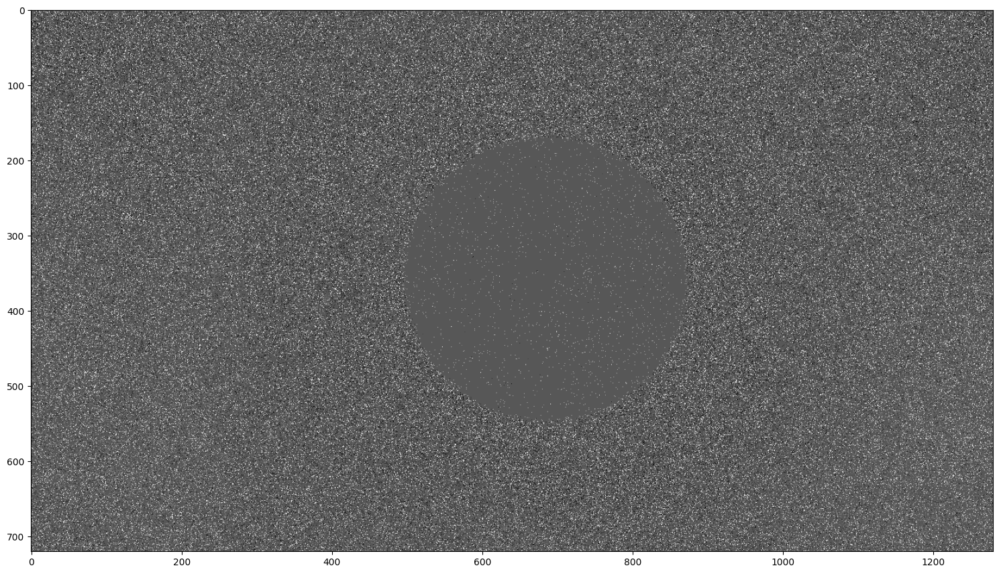

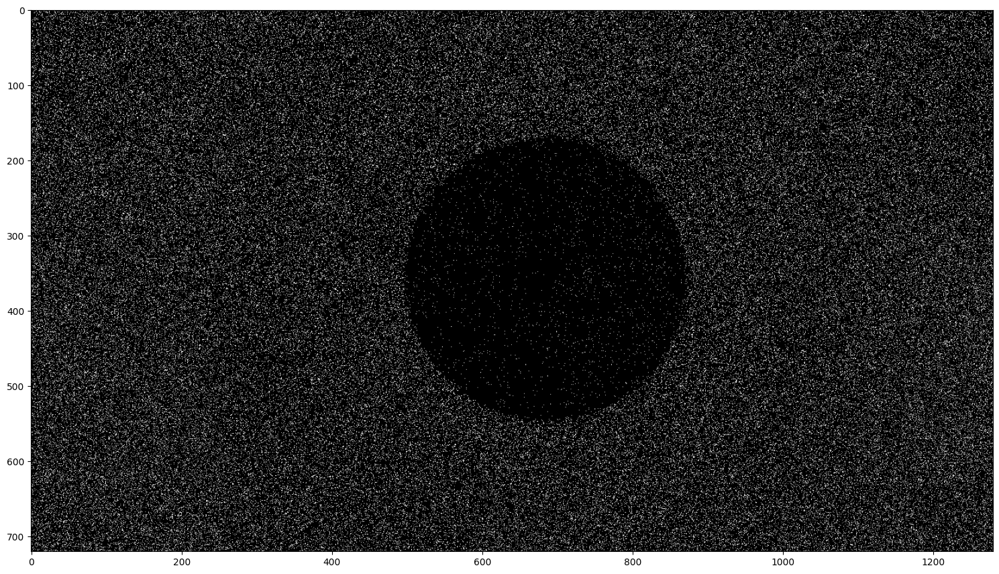

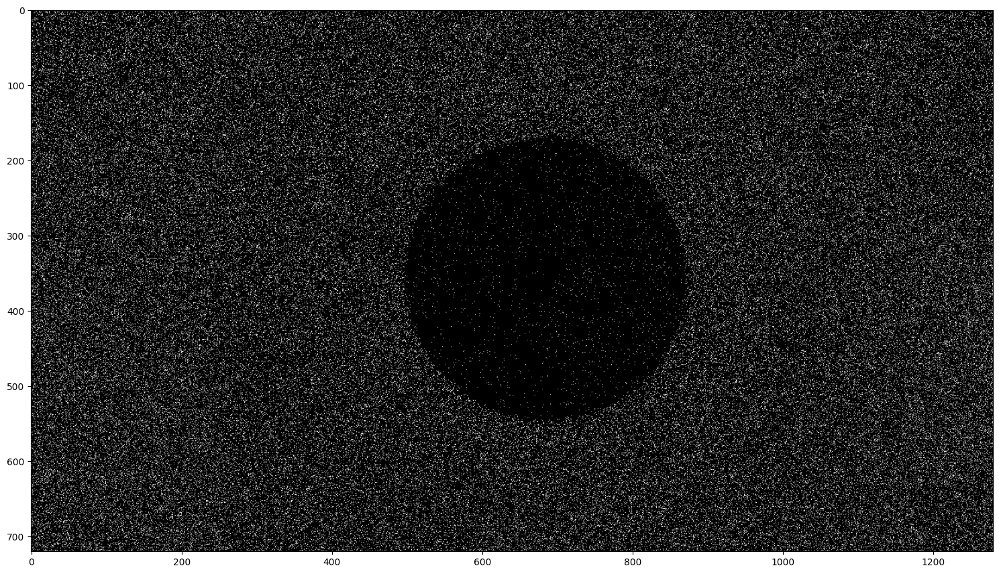

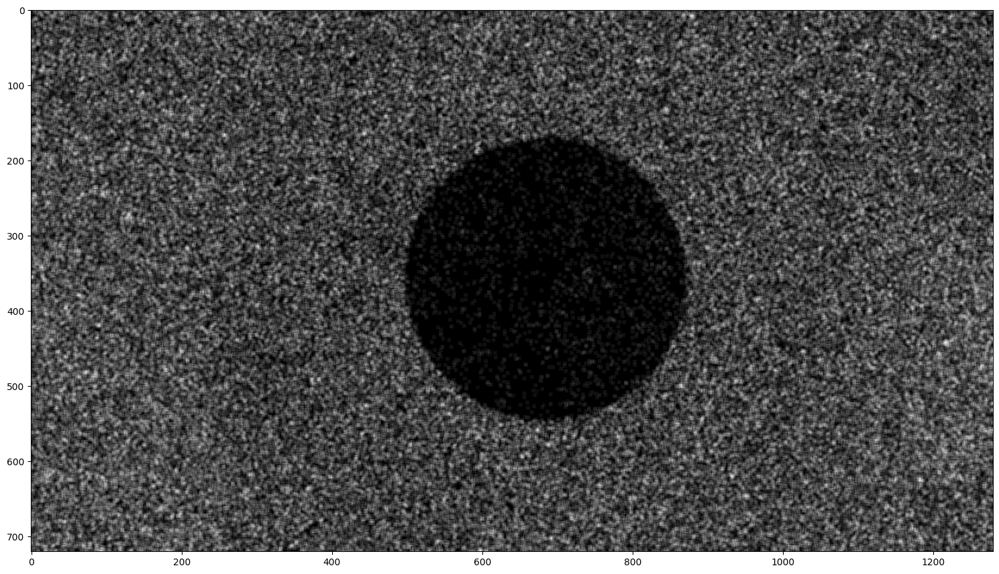

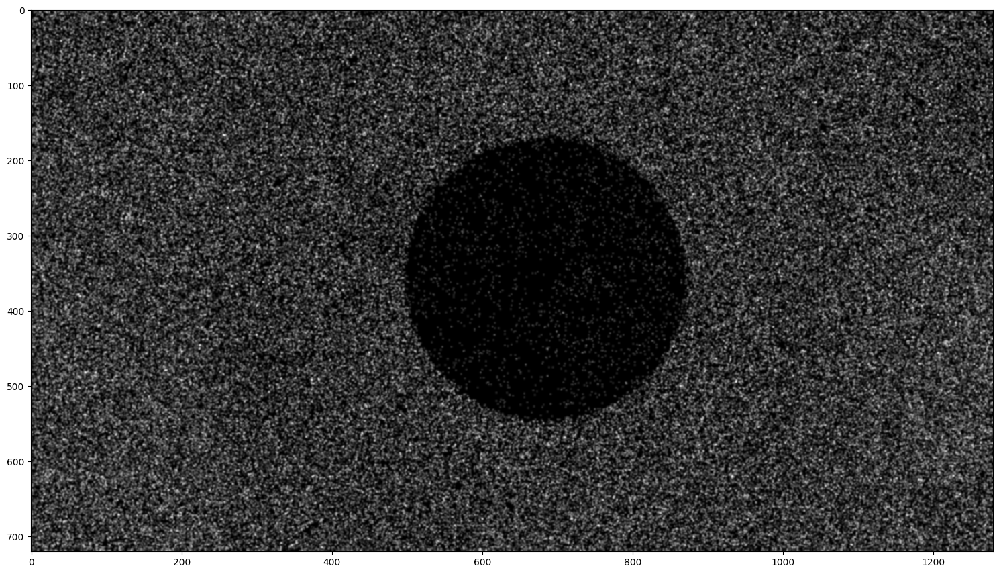

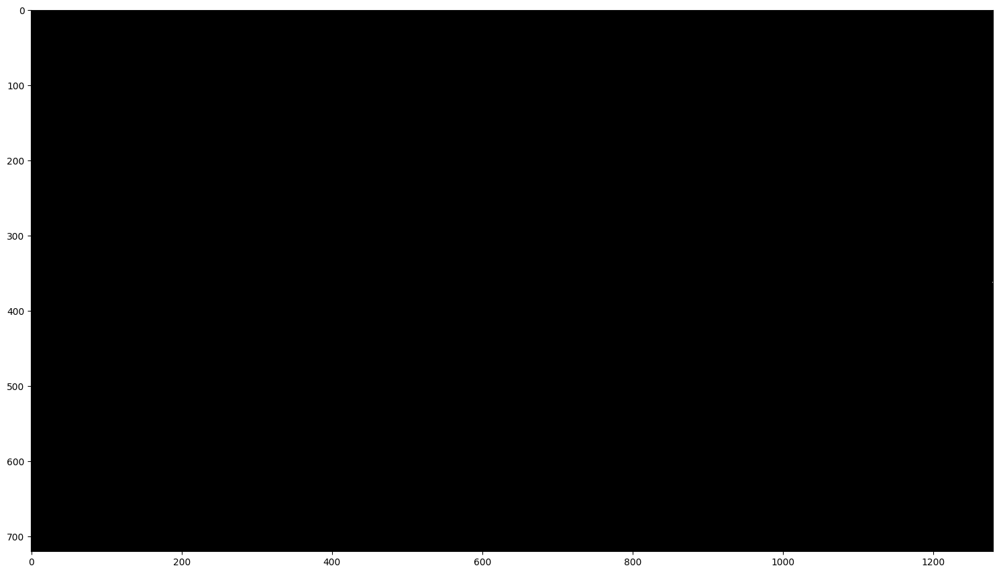

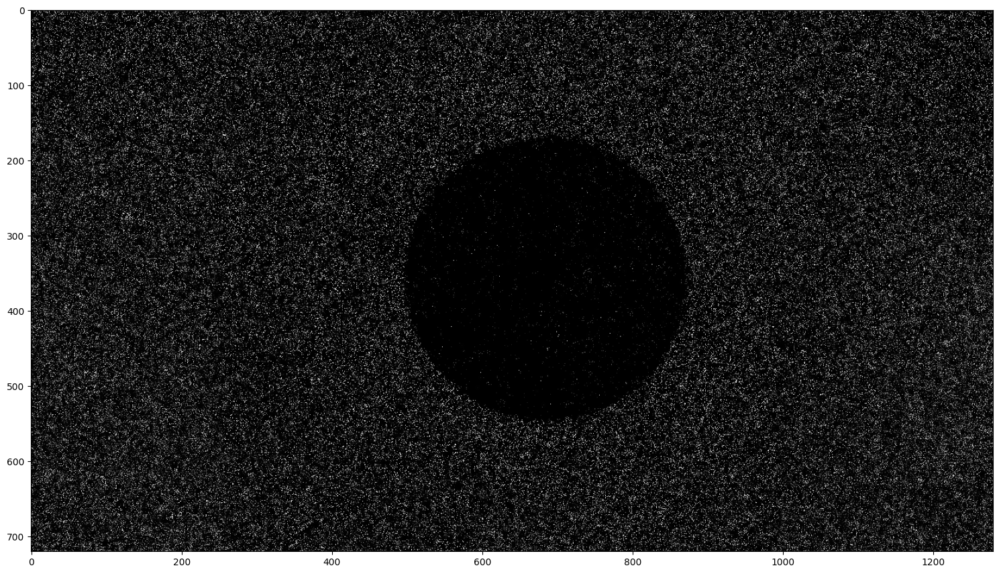

In [8]:
#Plor one frame as an example

frame =compact_frames[0]
plot_image(np.array(frame))

frame_thr = cv2.threshold(frame, 100, 1, cv2.THRESH_TOZERO)[1]
plot_image(frame_thr)

#Soften the image
dst = cv2.fastNlMeansDenoising(frame_thr)
plot_image(dst)

kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(frame_thr,-1,kernel)
plot_image(dst)


blur = cv2.GaussianBlur(frame_thr,(5,5),0)
plot_image(blur)
# Threshold filter

median = cv2.medianBlur(frame_thr,9)
plot_image(median)

blur = cv2.bilateralFilter(frame_thr,9,75,75)
plot_image(blur)


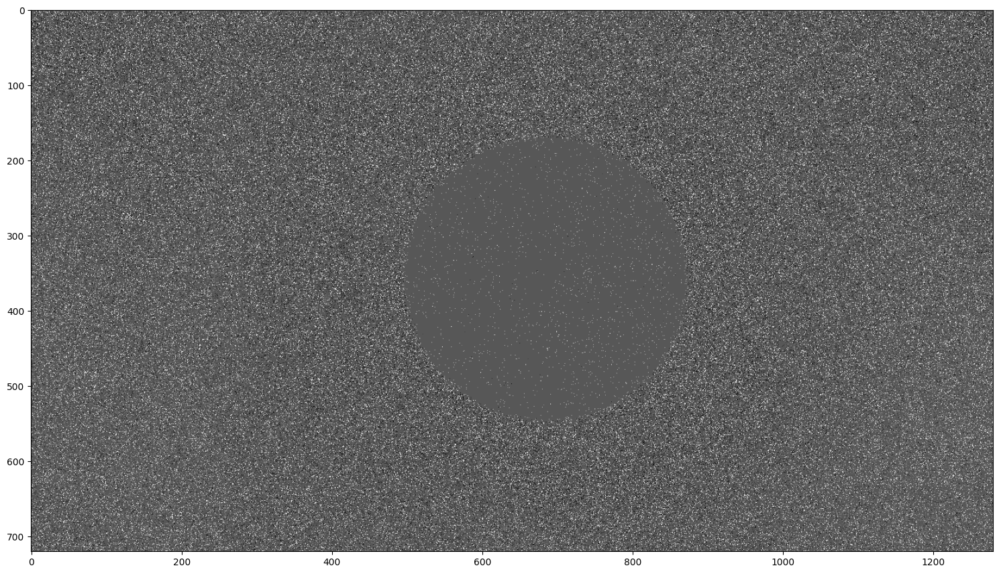

max value:  255 min value:  0


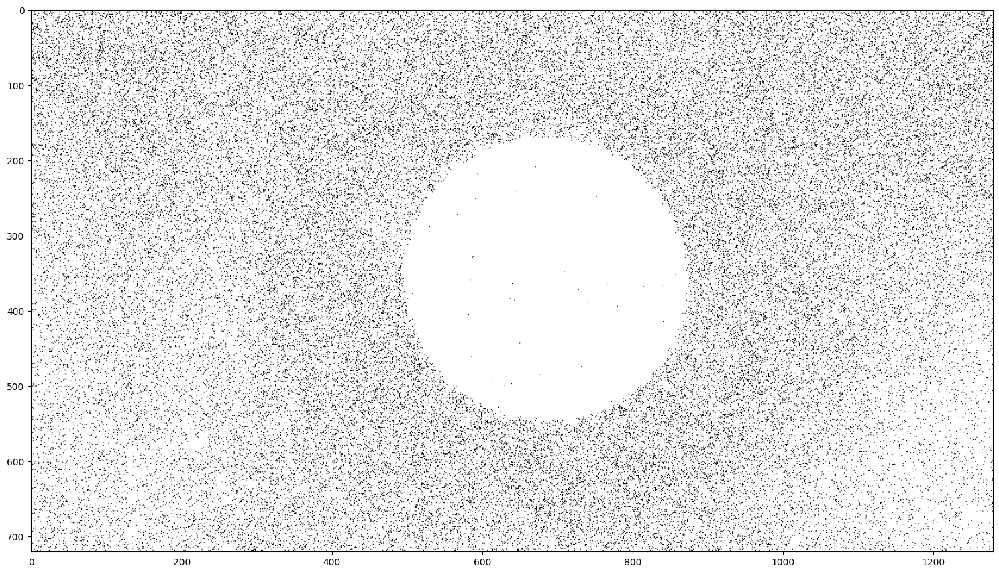

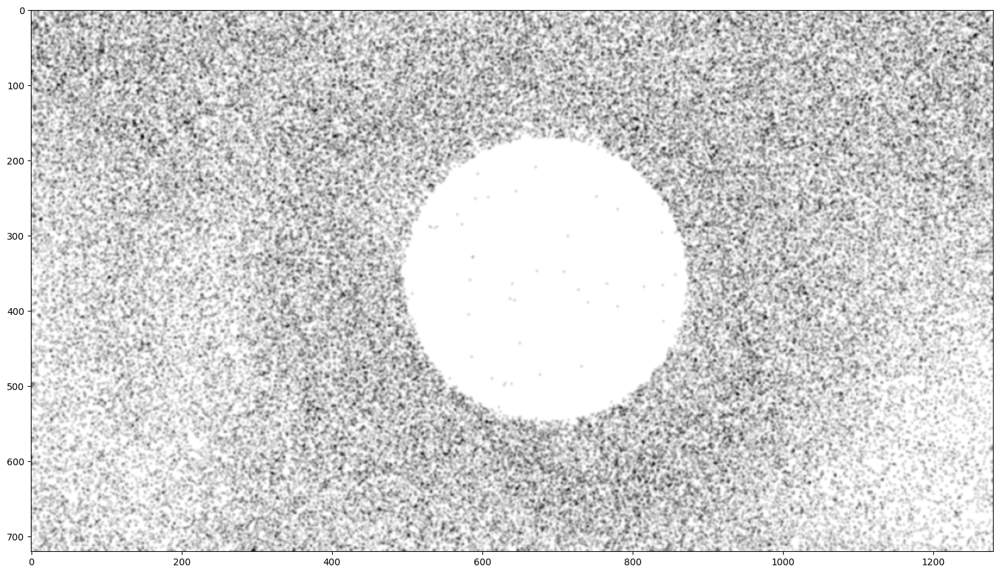

In [22]:
#Plor one frame as an example
from lib.plot_utils import *

frame =compact_frames[0]
plot_image(np.array(frame))

frame = cv2.threshold(frame, 50, 1, cv2.THRESH_BINARY)[1]
frame = frame*255

print('max value: ', np.max(frame), 'min value: ', np.min(frame))
plot_image(frame)

blur = cv2.GaussianBlur(frame,(7,7),0)
plot_image(blur)

# for i in range(5):
    
# for i in range(5):

#     blur = cv2.threshold(blur, 250, 1, cv2.THRESH_BINARY)[1]
#     blur = blur*255 
#     plot_image(blur)

#     blur = cv2.GaussianBlur(frame,(5,5),0)
#     plot_image(blur)

# cv_plot(cv2.cvtColor(blur*255, cv2.COLOR_GRAY2RGB) )
# cv_plot(frame )

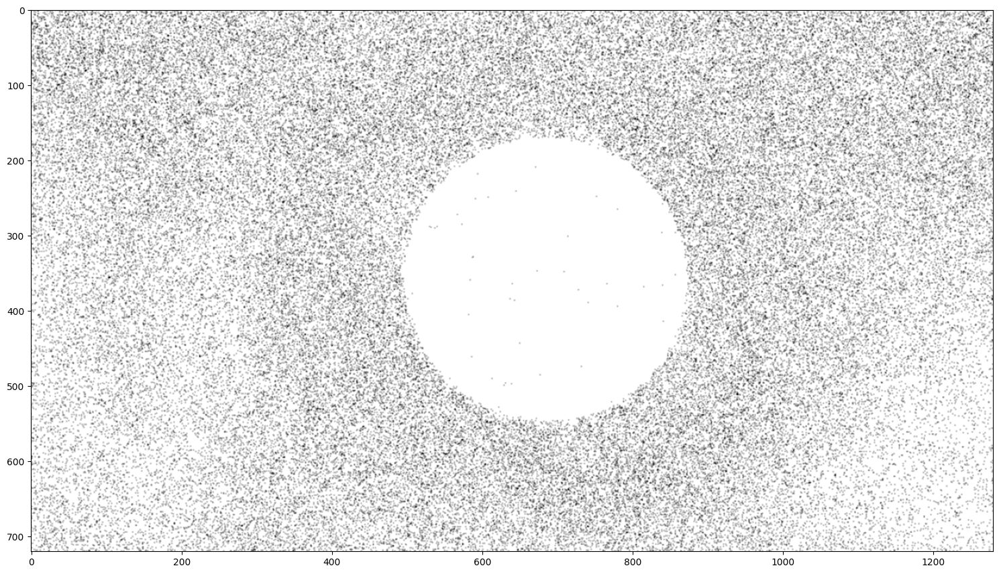

Circle center: (750, 350) , radius: 350
Circle center: (562, 362) , radius: 356
Circle center: (850, 360) , radius: 360
Circle center: (578, 224) , radius: 459
Circle center: (656, 402) , radius: 318
Circle center: (738, 212) , radius: 454
Circle center: (528, 458) , radius: 377
Circle center: (654, 296) , radius: 296
Circle center: (682, 524) , radius: 429
Circle center: (842, 260) , radius: 377
Circle center: (818, 458) , radius: 375
Circle center: (252, 406) , radius: 211
Circle center: (214, 518) , radius: 196
Circle center: (1062, 210) , radius: 184
Circle center: (252, 206) , radius: 172
Circle center: (352, 202) , radius: 157
Circle center: (316, 512) , radius: 167
Circle center: (168, 298) , radius: 157
Circle center: (988, 508) , radius: 150
Circle center: (1024, 354) , radius: 150
Circle center: (1124, 310) , radius: 150
Circle center: (1108, 570) , radius: 144
Circle center: (404, 570) , radius: 124
Circle center: (136, 434) , radius: 124
Circle center: (1276, 450) , radius:

qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in "/home/ignaciozm/.local/lib/python3.10/site-packages/cv2/qt/plugins"


In [14]:


# gray = cv2.cvtColor(compact_frames[0], cv2.GRAY2RGB)
plot_image(blur)

output = cv2.cvtColor(frame, cv2.COLOR_GRAY2RGB)
gray =  frame

# detect circles in the image
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, 100,
						   param1=30,param2=30,minRadius=20,maxRadius=600)
# ensure at least some circles were found
if circles is not None:
	# convert the (x, y) coordinates and radius of the circles to integers
	circles = np.round(circles[0, :]).astype("int")
	# loop over the (x, y) coordinates and radius of the circles
	
    # r = circles[0][2]

	for (x, y, r) in circles:
		# draw the circle in the output image, then draw a rectangle
		# corresponding to the center of the circle
		cv2.circle(output, (x, y), r, (0, 255, 0), 4)
		cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

		print(f"Circle center: {x,y} , radius: {r}")
	# show the output image
	cv2.imshow("output", output)
	cv2.waitKey(0)
	cv2.destroyAllWindows()
else:
	print("No circles found")

In [10]:
import numpy as np
import argparse
import cv2
import signal

from functools import wraps
import errno
import os
import copy


frame =compact_frames[0]
frame = cv2.threshold(frame, 50, 1, cv2.THRESH_BINARY)[1]
frame = frame*255

blur = cv2.GaussianBlur(frame,(7,7),0)
plot_image(blur)

# image = cv2.imread(args["image"])
image = cv2.cvtColor(blur, cv2.COLOR_GRAY2RGB)
orig_image = np.copy(image)
output = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

circles = None

minimum_circle_size = 300      #this is the range of possible circle in pixels you want to find
maximum_circle_size = 500     #maximum possible circle size you're willing to find in pixels

guess_dp = 1.0

number_of_circles_expected = 1          #we expect to find just one circle
breakout = False

max_guess_accumulator_array_threshold = 100     #minimum of 1, no maximum, (max 300?) the quantity of votes 
                                                #needed to qualify for a circle to be found.
circleLog = []

guess_accumulator_array_threshold = max_guess_accumulator_array_threshold


while guess_accumulator_array_threshold > 1 and breakout == False:
    #start out with smallest resolution possible, to find the most precise circle, then creep bigger if none found
    guess_dp = 1.0
    print("resetting guess_dp:" + str(guess_dp))
    while guess_dp < 9 and breakout == False:
        guess_radius = maximum_circle_size
        print("setting guess_radius: " + str(guess_radius))
        print(circles is None)
        while True:

            #HoughCircles algorithm isn't strong enough to stand on its own if you don't
            #know EXACTLY what radius the circle in the image is, (accurate to within 3 pixels) 
            #If you don't know radius, you need lots of guess and check and lots of post-processing 
            #verification.  Luckily HoughCircles is pretty quick so we can brute force.

            print("guessing radius: " + str(guess_radius) + 
                    " and dp: " + str(guess_dp) + " vote threshold: " + 
                    str(guess_accumulator_array_threshold))


            circles = cv2.HoughCircles(gray, 
                cv2.HOUGH_GRADIENT, 
                dp=guess_dp,               #resolution of accumulator array.
                minDist=100,                #number of pixels center of circles should be from each other, hardcode
                param1=50,
                param2=guess_accumulator_array_threshold,
                minRadius=(guess_radius-3),    #HoughCircles will look for circles at minimum this size
                maxRadius=(guess_radius+3)     #HoughCircles will look for circles at maximum this size
                )

            if circles is not None:
                if len(circles[0]) == number_of_circles_expected:
                    print("len of circles: " + str(len(circles)))
                    circleLog.append(copy.copy(circles))
                    print("k1")
                break
                circles = None
            guess_radius -= 5 
            if guess_radius < 40:
                break

        guess_dp += 1.5

    guess_accumulator_array_threshold -= 2

#Return the circleLog with the highest accumulator threshold

# ensure at least some circles were found
for cir in circleLog:
    # convert the (x, y) coordinates and radius of the circles to integers
    output = np.copy(orig_image)

    if (len(cir) > 1):
        print("FAIL before")
        exit()

    print(cir[0, :])

    cir = np.round(cir[0, :]).astype("int")

    for (x, y, r) in cir:
        cv2.circle(output, (x, y), r, (0, 0, 255), 2)
        cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

    cv2.imshow("output", np.hstack([orig_image, output]))
    cv2.waitKey(0)

resetting guess_dp:1.0
setting guess_radius: 500
True
guessing radius: 500 and dp: 1.0 vote threshold: 100
guessing radius: 495 and dp: 1.0 vote threshold: 100
guessing radius: 490 and dp: 1.0 vote threshold: 100
guessing radius: 485 and dp: 1.0 vote threshold: 100
guessing radius: 480 and dp: 1.0 vote threshold: 100
guessing radius: 475 and dp: 1.0 vote threshold: 100
guessing radius: 470 and dp: 1.0 vote threshold: 100
guessing radius: 465 and dp: 1.0 vote threshold: 100
guessing radius: 460 and dp: 1.0 vote threshold: 100
guessing radius: 455 and dp: 1.0 vote threshold: 100
guessing radius: 450 and dp: 1.0 vote threshold: 100
guessing radius: 445 and dp: 1.0 vote threshold: 100
guessing radius: 440 and dp: 1.0 vote threshold: 100
guessing radius: 435 and dp: 1.0 vote threshold: 100
guessing radius: 430 and dp: 1.0 vote threshold: 100
guessing radius: 425 and dp: 1.0 vote threshold: 100
guessing radius: 420 and dp: 1.0 vote threshold: 100
guessing radius: 415 and dp: 1.0 vote thresho

qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in "/home/ignaciozm/.local/lib/python3.10/site-packages/cv2/qt/plugins"


[[734.  398.  485.6]]
[[734.  398.  485.6]]
[[734.  398.  485.6]]


## Self coded method

Max row: 334, max row sum: 309825
Max col: 684, max col sum: 176205
[[array([335, 684]), 59585595, array([334, 684])]]


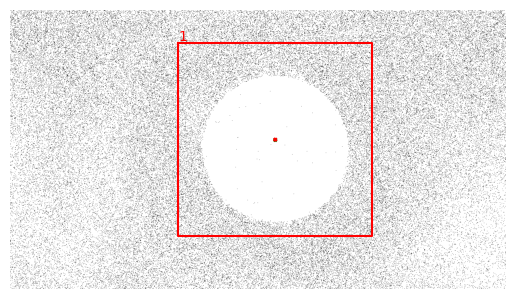

TypeError: list indices must be integers or slices, not tuple

In [75]:
row_sum = np.sum(frame, axis=1)
col_sum = np.sum(frame, axis=0)

max_row_sum = np.max(row_sum)
max_row = np.argmax(row_sum)

max_col_sum = np.max(col_sum)
max_col = np.argmax(col_sum)

print(f"Max row: {max_row}, max row sum: {max_row_sum}")
print(f"Max col: {max_col}, max col sum: {max_col_sum}")

# frame[max_row,:] = 0   
# frame[:,max_col] = 0

cluster = index_cluster(frame, 250, np.array([[max_row, max_col]]))
print(cluster)
plot_cluster(frame, cluster, 250)

# Copy the pixel values of the cluster to a new image
img = np.zeros_like(frame)
img[cluster[:,0], cluster[:,1]] = frame[cluster[:,0], cluster[:,1]]
plot_image(img)


## WORKING VERSION (CAN BE UPGRADED)

In [20]:
sun_aparent_diameter = 0.54152 # From stelarium [degrees]
FOV = 2                # From stelarium (Depends on zoom) [degrees]

compact_frame = compact_frames[0]
frame = cv2.threshold(compact_frame, 100, 1, cv2.THRESH_TOZERO)[1]

for i in range(96):
    frame = cv2.blur(frame,(5,5))
    frame = cv2.threshold(frame, 5, 1, cv2.THRESH_TOZERO)[1]

circles = cv2.HoughCircles(frame, cv2.HOUGH_GRADIENT, 1, 300,
                param1=10,param2=30,minRadius=200,maxRadius=600)

if circles is not None:

    if len(circles) > 1:
        print("Error: More than one circle detected")
    else:
        print('Circle detected, diameter: ', circles[0][0][2]*2, ' [pixels], pixel to degree ratio: '
            , sun_aparent_diameter/circles[0][0][2]*2, ' [degrees/pixel]',    'FOV: ', FOV, ' [degrees]')
else:
    print('No circle detected')

Circle detected, diameter:  418.3999938964844  [pixels], pixel to degree ratio:  0.005177055524852388  [degrees/pixel] FOV:  2  [degrees]


In [21]:
# Visualization 
# detect circles in the image

output = cv2.cvtColor(frame, cv2.COLOR_GRAY2RGB)
gray =  frame

circles = cv2.HoughCircles(frame, cv2.HOUGH_GRADIENT, 1, 300,
                param1=10,param2=30,minRadius=200,maxRadius=600)

# ensure at least some circles were found
if circles is not None:
	# convert the (x, y) coordinates and radius of the circles to integers
	circles = np.round(circles[0, :]).astype("int")
	# loop over the (x, y) coordinates and radius of the circles
	
    # r = circles[0][2]

	for (x, y, r) in circles:
		# draw the circle in the output image, then draw a rectangle
		# corresponding to the center of the circle
		cv2.circle(output, (x, y), r, (0, 255, 0), 4)
		cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

		print(f"Circle center: {x,y} , radius: {r}")
	# show the output image
	cv2.imshow("output", output)
	cv2.waitKey(0)
	cv2.destroyAllWindows()
else:
	print("No circles found")

Circle center: (676, 360) , radius: 209
